In [ ]:
#EDA

In [1]:
# Importing required libraries.
import numpy as np
import pandas as pd
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import plotly.express as px
import pandas as pd
import numpy as np
import itertools
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, acf, pacf,arma_order_select_ic
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
from sklearn.model_selection import train_test_split
import warnings
warnings.simplefilter('ignore')
import pandas as pd
import numpy as np
import seaborn as sns #visualisation
import matplotlib.pyplot as plt #visualisation
%matplotlib inline
import plotly.graph_objs as go#visualization
from plotly.offline import iplot
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import  accuracy_score,precision_score,recall_score,f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
import warnings
warnings.filterwarnings('ignore')
sns.set(color_codes=True)
import plotly.express as px

import matplotlib.pyplot as plt
import seaborn as sns
     


# Load data
#from google.colab import drive

#drive.mount('/content/drive')

#path = "/content/drive/MyDrive/Colab Notebooks/cleaned_data.csv"
#df= pd.read_csv(path)

data= pd.read_csv("cleaned_data_csv.csv")

Africa           49373
Europe           37088
Asia             36200
North America    24931
South America     9517
Oceania           9217
Name: Continent, dtype: int64

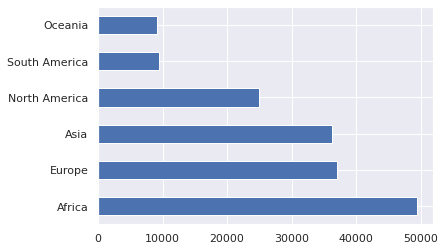

In [38]:
data['Continent'].value_counts()[:20].plot(kind='barh')
data['Continent'].value_counts()

Text(0, 0.5, 'New cases')

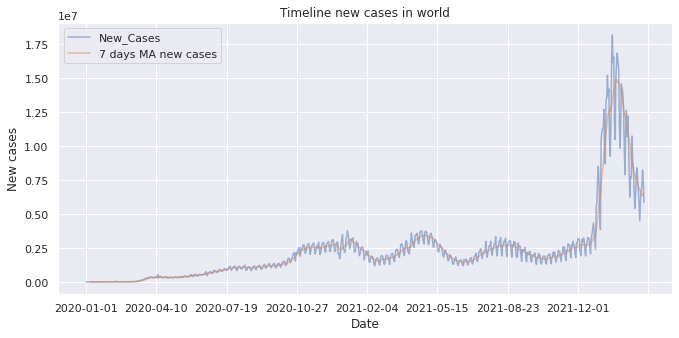

In [7]:
data2=data.copy()
data2 = data.copy()
data2.date = pd.to_datetime(data2['Date'])
data2 = data2.groupby('Date').sum()
data2['7 days MA new cases'] = 0
data2['7 days MA new cases'] = data2['New_Cases'].rolling(7).mean() #Moving average of new cases with window=10
data2['7 days MA new deaths'] = 0
data2['7 days MA new deaths'] = data2['New_deaths'].rolling(7).mean()  #Moving average of new deaths with window=10

data2[['New_Cases', '7 days MA new cases']].plot(figsize = (11, 5), alpha = 0.5)
plt.title('Timeline new cases in world')
plt.xlabel('Date')
plt.ylabel('New cases')

Text(0, 0.5, 'New deaths')

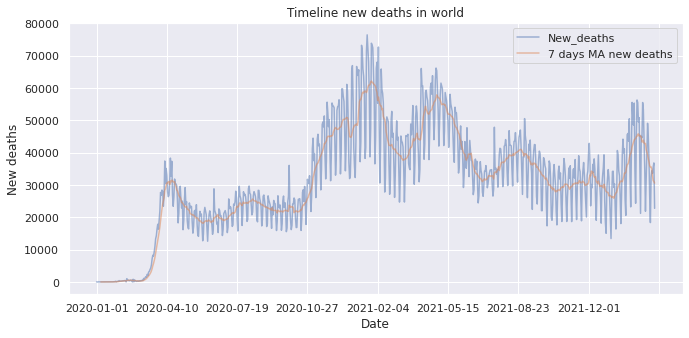

In [8]:
data2[['New_deaths', '7 days MA new deaths']].plot(figsize = (11, 5), alpha = 0.5)
plt.title('Timeline new deaths in world')
plt.xlabel('Date')
plt.ylabel('New deaths')

In [30]:
def create_and_plot_df(df, country):
    #Selecting the 7 key columns for country in dataset
    df=df[df['Location']==country].copy()
    df=df[['Date','Total_Cases','New_Cases',
         'Total_deaths','New_deaths',
         "people vaccinated per hundred", "people_fully_vaccinated_per_hundred",
         "total deaths per million","new cases per million"]].copy()

    #Convert to datetime
    df.date = pd.to_datetime(df['Date'])
    #Fixing the mistakes in uk data.
    if country=='United Kingdom':
        df.loc[df['Date']=='2022-01-31','New_Cases'] = 92368
        df.loc[df['Date']=='2022-02-01','New_deaths'] = 219
        df.loc[df['Date']=='2022-01-31',"new cases per million"] = 1354
        df.loc[df['Date']=='2022-02-01',"total deaths per million"] = 3.211
        df.loc[df['Date']=='2021-04-09','New_Cases'] = 3150
        df.loc[df['Date']=='2021-04-09',"new cases per million"] = 46
        df.loc[df['Date']=='2021-05-18','New_Cases'] = 2412
        df.loc[df['Date']=='2021-05-18',"new cases per million"] = 35
    else:
        pass
  
    #Set the date as index and compute moving average with window=7 for new_cases and new_deaths
    df.set_index('Date', inplace=True)
    df['7 days MA new cases'] = 0
    df['7 days MA new cases'] = df['New_Cases'].rolling(7).mean()
    df['7 days MA new deaths'] = 0
    df['7 days MA new deaths'] = df['New_deaths'].rolling(7).mean()
    df['7 days MA new cases per million'] = 0
    df['7 days MA new cases per million'] = df["new cases per million"].rolling(7).mean()
    df['7 days MA new deaths per million'] = 0
    df['7 days MA new deaths per million'] = df["total deaths per million"].rolling(7).mean()
  
    #Plot new cases, new deaths and people vaccinated 
    df[['New_Cases', '7 days MA new cases']].plot(figsize = (15, 5), alpha = 0.5)
    plt.title(f'Timeline new cases in {country}')

    df[['New_deaths', '7 days MA new deaths']].plot(figsize = (15, 5), alpha = 0.5)
    if country=='Chile':
        plt.ylim([0,400])
    else:
        pass
    plt.title(f'Timeline new deaths in {country}')



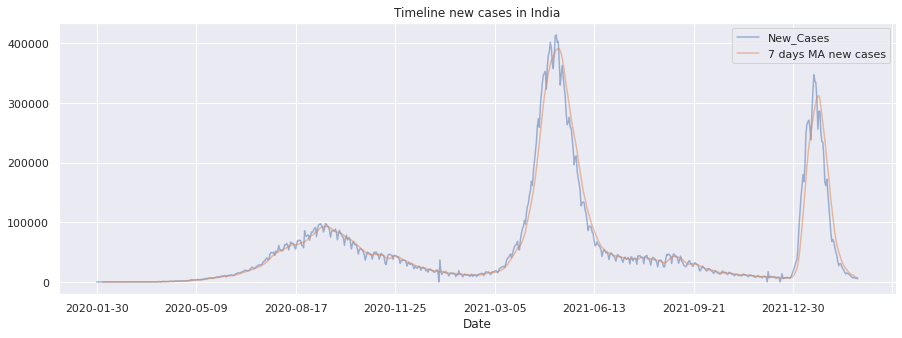

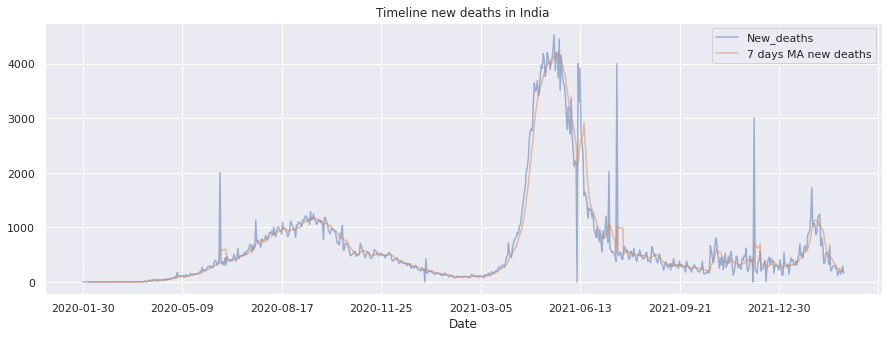

In [31]:
df_india=create_and_plot_df(data,'India')

In [39]:
import seaborn as sns

<AxesSubplot:xlabel='Total_Cases', ylabel='total tests'>

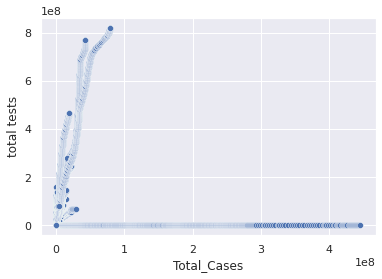

In [36]:
sns.scatterplot(x='Total_Cases',y="total tests",data=data)

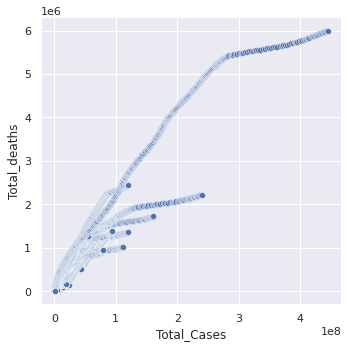

In [52]:
sns.relplot(x="Total_Cases",y="Total_deaths",data=data)

In [53]:
sns.pairplot(data)

KeyboardInterrupt: ignored

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7f1a802220d0> (for post_execute):


KeyboardInterrupt: ignored

Error in callback <function flush_figures at 0x7f1a8021ef70> (for post_execute):


KeyboardInterrupt: ignored

In [72]:
def plot_map(data, col, pal):
    df = data[data[col]>0]
    fig = px.choropleth(df, locations="Location",locationmode='country names', 
                  color=col, hover_name="Location", 
                  title=col, hover_data=[col], color_continuous_scale=pal)
#     fig.update_layout(coloraxis_showscale=False)
    fig.show()

In [73]:
plot_map(data, 'Total_Cases', 'matter')

In [74]:
def plot_daywise(col, hue):
    fig = px.bar(data, x="Date", y=col, width=700, color_discrete_sequence=[hue])
    fig.update_layout(title=col, xaxis_title="", yaxis_title="")
    fig.show()

In [76]:
plot_daywise('New_Cases', '#333333')

In [85]:
def plot_stacked(col):
    fig = px.bar(data, x="Date", y=col, color='Continent', 
                 height=600, title=col, 
                 color_discrete_sequence = px.colors.cyclical.mygbm)
    fig.update_layout(showlegend=True)
    fig.show()

In [86]:
plot_stacked('Total_Cases')

In [91]:
def plot_treemap(col):
    fig = px.treemap(data, path=["Continent"], values=col, height=700,
                 title=col, color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.data[0].textinfo = 'label+text+value'
    fig.show()

In [92]:
plot_treemap('Total_Cases')

In [93]:
px.box(data, x='Continent', y='Total_Cases', color='Continent',
       title='Distribution of country wise no. of cases in different WHO Region')